# Recomendador de inversiones inmoviliarias

## Datos origen:

- [gen_bcn_precios](datasets/gen_bcn_precios.csv)


## Tareas:

1. Asignar precio estadístico de alquiler y compraventa a cada inmueble basado en su barrio o distrito
1. Crear una puntuación para cada barrio o distrito de 0 a 1
1. Crear una puntuación para el precio de compra para cada inmueble de 0 a 1 en función del precio estadístico de compra de cada barrio o distrito
1. Crear una puntuación para el precio de alquiler para cada inmueble de 0 a 1 en función del precio estadístico de alquiler de cada barrio o distrito
1. Calcular la tasa de retorno de cada inmueble en función del precio de compra y el precio de alquiler
1. Crear una puntuación final para cada inmueble de 0 a 1 en función de las puntuaciones anteriores
1. Modelo de ML para extrapolar precios estadístico de alquiler y compraventa a fecha de hoy


In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

bcn_precios = pd.read_csv('datasets/gen_precios.csv')
# Conversión de mes a periodo
bcn_precios['mes'] = pd.to_datetime(bcn_precios['mes'])#.dt.to_period('M')
# limpieza de datos anteriores a 2014
bcn_precios = bcn_precios[bcn_precios['mes'].dt.year >= 2014]
bcn_precios

,id,nombre,sup_id,sup_nombre,tipo,mes,precio_alquiler,precio_venta,superficie_venta
24,80101,el raval,80100,ciutat vella,barri,2014-01-01,10.62,1772.0,1491.0
25,80101,el raval,80100,ciutat vella,barri,2014-02-01,NaN,1508.0,2982.0
26,80101,el raval,80100,ciutat vella,barri,2014-03-01,NaN,1770.0,NaN
27,80101,el raval,80100,ciutat vella,barri,2014-04-01,10.52,1721.0,NaN
28,80101,el raval,80100,ciutat vella,barri,2014-05-01,NaN,1678.0,NaN
...,...,...,...,...,...,...,...,...,...
11281,80000,barcelona,800000,barcelones,municipi,2024-05-01,NaN,3793.0,NaN
11282,80000,barcelona,800000,barcelones,municipi,2024-06-01,NaN,3846.0,122345.0
11283,80000,barcelona,800000,barcelones,municipi,2024-07-01,NaN,3835.0,NaN
11284,80000,barcelona,800000,barcelones,municipi,2024-08-01,NaN,3833.0,NaN


A la hora de valorar una inversión de compra de vivienda para alquilar, es fundamental analizar indicadores que reflejen tanto la rentabilidad potencial como los riesgos asociados a la inversión. Estos indicadores pueden agruparse en categorías relacionadas con el mercado inmobiliario, las características del barrio o ciudad, y el perfil de los potenciales inquilinos. A continuación, se enumeran los más relevantes:

---

### **1. Indicadores de mercado inmobiliario**
1. **Rentabilidad bruta de alquiler**: 
   - Fórmula: \( \text{Rentabilidad bruta} = \frac{\text{Ingreso anual por alquiler}}{\text{Precio de compra}} \times 100 \).
   - Mide cuánto porcentaje del precio de compra se recupera anualmente a través del alquiler.
   
2. **Rentabilidad neta de alquiler**:
   - Similar a la rentabilidad bruta, pero descontando los costos asociados (mantenimiento, impuestos, seguros, etc.).
   
3. **Precio medio de compra por m²**:
   - Sirve para comparar si el precio del inmueble está alineado con los valores del mercado en el barrio o ciudad.

4. **Precio medio de alquiler por m²**:
   - Ayuda a evaluar la demanda de alquiler y la competitividad del precio esperado.

5. **Diferencia de precio compra/alquiler entre barrios o ciudades cercanas**:
   - Comparar la relación entre los precios de compra y alquiler en diferentes zonas ayuda a identificar mercados infravalorados o sobrevalorados.


La **elasticidad del precio de venta con respecto a la superficie de venta** mide cómo cambia porcentualmente el precio de venta ante un cambio porcentual en la superficie. Se calcula como:  

\[
\text{Elasticidad} = \frac{\%\Delta \text{Precio de Venta}}{\%\Delta \text{Superficie de Venta}}
\]

Para calcularla **anualmente** con el dataset dado, seguiremos estos pasos:


### **Interpretación de la elasticidad**
1. **Elasticidad positiva** (>0): Indica que un aumento en la superficie de venta se asocia con un aumento en el precio de venta, lo cual es intuitivo en mercados donde la superficie adicional tiene valor.
2. **Elasticidad negativa** (<0): Puede indicar un mercado donde la relación entre precio y superficie es inversa, posiblemente porque otras características (ubicación, calidad, etc.) influyen más.
3. **Elasticidad cercana a 1**: Relación proporcional entre precio y superficie.
4. **Elasticidad alta (>1)**: El precio es altamente sensible a cambios en la superficie.
5. **Elasticidad baja (<1)**: El precio es menos sensible a cambios en la superficie.


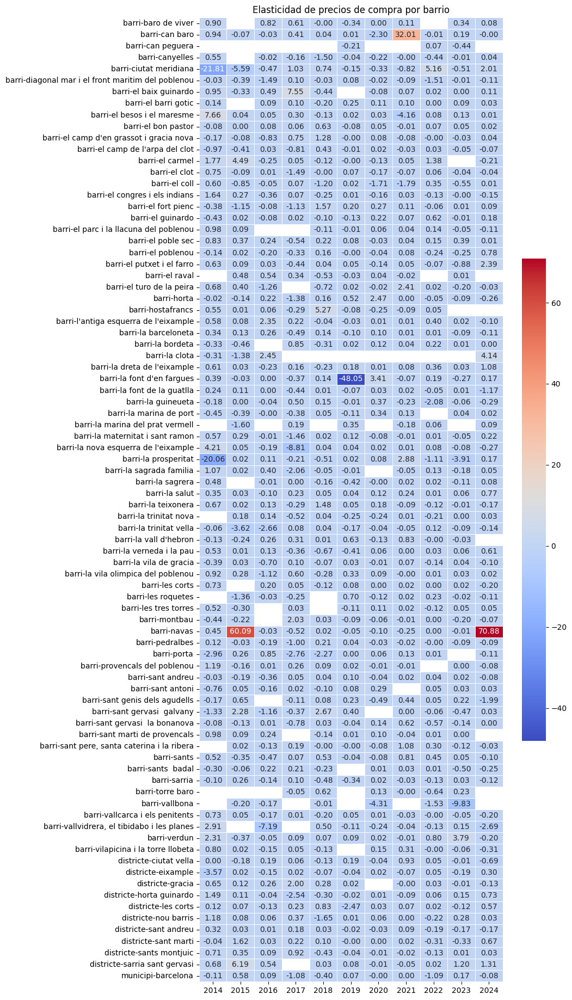

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

elasticidad = bcn_precios.copy()
elasticidad['año'] = elasticidad['mes'].dt.year


# Agrupar por año y calcular los promedios de precio y superficie
elasticidad = elasticidad.groupby(by=['tipo', 'id', 'nombre', 'sup_id', 'sup_nombre', 'año']).agg({
    'precio_venta': 'mean',
    'superficie_venta': 'mean'
}).reset_index()

# elasticidad = elasticidad.groupby(['tipo','nombre','año']).agg({
#     'precio_venta': 'mean',
#     'superficie_venta': 'mean'
# }).reset_index()

# display(elasticidad[elasticidad['nombre'] == 'navas'])
# display(elasticidadn[elasticidadn['nombre'] == 'horta'])

# Calcular la tasa de variación porcentual (\(\Delta\%\))
elasticidad['delta_precio_venta'] = elasticidad['precio_venta'].pct_change()
elasticidad['delta_superficie_venta'] = elasticidad['superficie_venta'].pct_change()

# Calcular la elasticidad
elasticidad['elasticidad'] = elasticidad['delta_precio_venta'] / elasticidad['delta_superficie_venta']

def cohort_heatmap(df, index, columns, values, title, figsize=(9, 23), fmt='.2f'):
    df = df.dropna().pivot_table(index=index, columns=columns, values=values)

    plt.figure(figsize=figsize)
    sns.heatmap(df, annot=True, cmap='coolwarm', linewidths=.5, cbar_kws={"shrink": .5}, fmt=fmt)
    plt.title(title)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()

cohort_heatmap(elasticidad, index=['tipo','nombre'], columns='año', values='elasticidad', title='Elasticidad de precios de compra por barrio')




1. **Rentabilidad bruta de alquiler**: 
   - Fórmula: \( \text{Rentabilidad bruta} = \frac{\text{Ingreso anual por alquiler}}{\text{Precio de compra}} \times 100 \).
   - Mide cuánto porcentaje del precio de compra se recupera anualmente a través del alquiler.

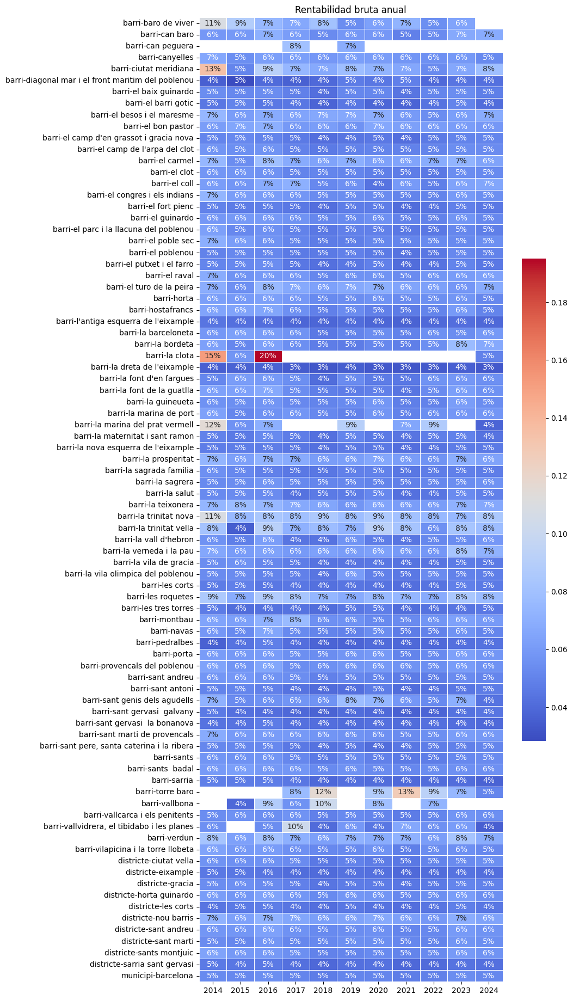

In [3]:
rentabilidad = bcn_precios.copy()
rentabilidad['año'] = rentabilidad['mes'].dt.year

# Agrupar por año y calcular los promedios de precio y superficie
rentabilidad = rentabilidad.groupby(by=['tipo', 'id', 'nombre', 'sup_id', 'sup_nombre', 'año']).agg({
    'precio_venta': 'mean',
    'precio_alquiler': 'mean'
}).reset_index()

# Calcular la tasa de variación porcentual (\(\Delta\%\))
rentabilidad['rentabilidad'] = rentabilidad['precio_alquiler'] * 12 / rentabilidad['precio_venta']

cohort_heatmap(rentabilidad, index=['tipo','nombre'], columns='año', values='rentabilidad', title='Rentabilidad bruta anual', fmt='.0%')



La **tasa de crecimiento** de `precio_alquiler` a lo largo de los meses puede calcularse utilizando las siguientes fórmulas: 

1. **Tasa de crecimiento mensual relativa**: 
   \[
   \text{Tasa de crecimiento} = \frac{\text{precio\_alquiler}_{t} - \text{precio\_alquiler}_{t-1}}{\text{precio\_alquiler}_{t-1}} \times 100
   \]
   Esto mide el cambio porcentual de un mes respecto al mes anterior.

2. **Tasa de crecimiento acumulada** (opcional): 
   Para observar el crecimiento relativo al precio inicial en el periodo de análisis, se calcula:
   \[
   \text{Crecimiento acumulado} = \frac{\text{precio\_alquiler}_{t} - \text{precio\_alquiler}_{\text{inicio}}}{\text{precio\_alquiler}_{\text{inicio}}} \times 100
   \]


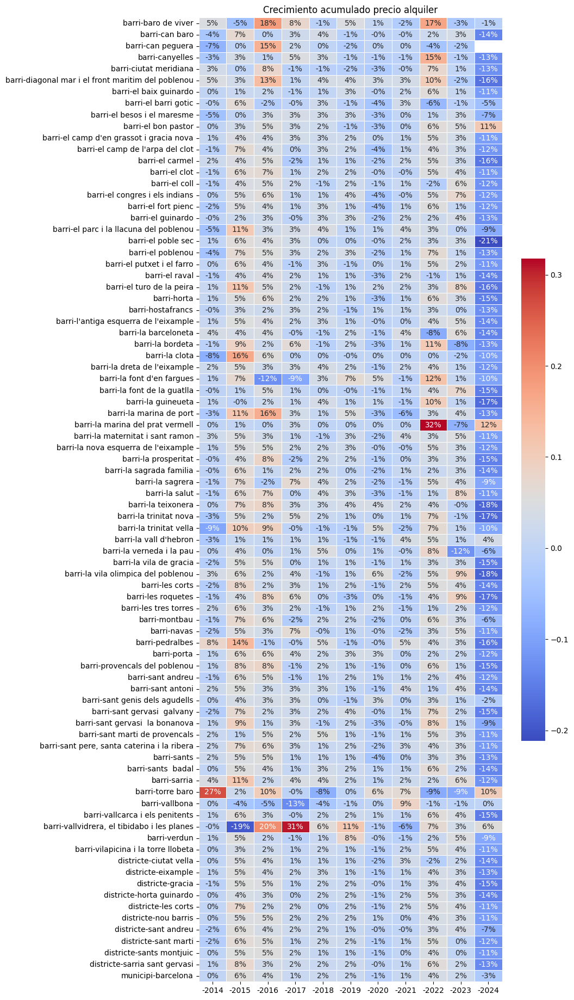

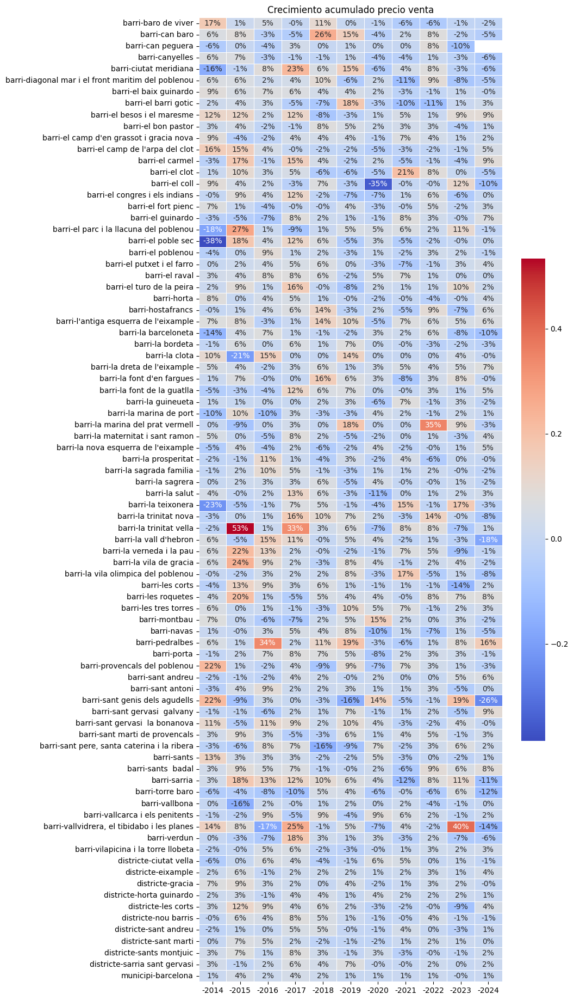

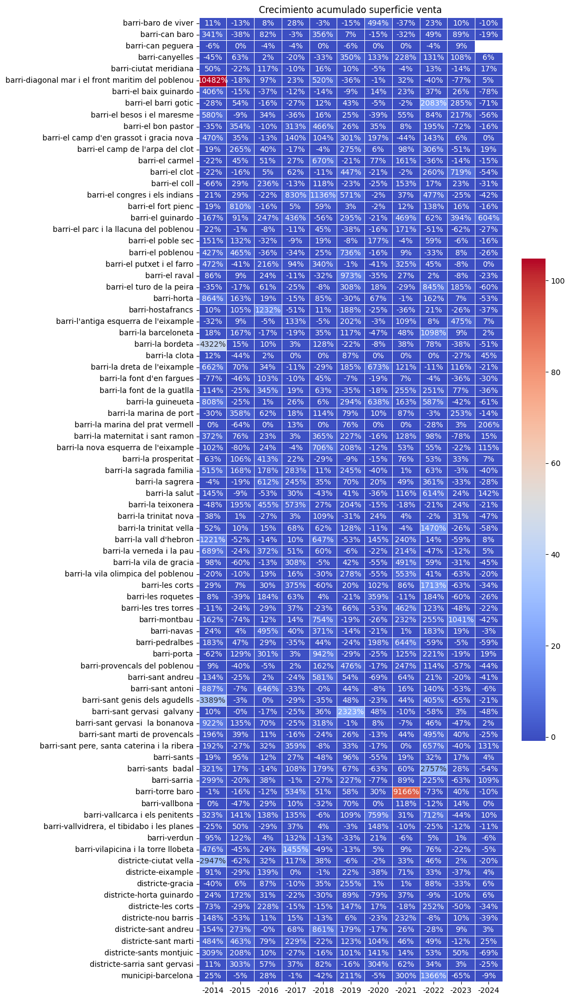

In [4]:
crecimiento = bcn_precios.copy()
crecimiento['precio_alquiler'] = crecimiento['precio_alquiler'].interpolate()
crecimiento['precio_venta'] = crecimiento['precio_venta'].interpolate()
crecimiento['superficie_venta'] = crecimiento['superficie_venta'].interpolate()
crecimiento['año'] = crecimiento['mes'].dt.year

# Agrupar por año y calcular los promedios de precio y superficie
crecimiento = crecimiento.groupby(by=['tipo', 'id', 'nombre', 'sup_id', 'sup_nombre', 'año']).agg({
    'precio_alquiler': ['first','mean'],
    'precio_venta': ['first','mean'],
    'superficie_venta': ['first','mean']
}).reset_index()

# Calcular la crecimiento
crecimiento['grow_acu_alquiler'] = (crecimiento['precio_alquiler']['mean'] - crecimiento['precio_alquiler']['first']) / crecimiento['precio_alquiler']['first']
crecimiento['grow_acu_venta'] = (crecimiento['precio_venta']['mean'] - crecimiento['precio_venta']['first']) / crecimiento['precio_venta']['first']
crecimiento['grow_acu_superficie_venta'] = (crecimiento['superficie_venta']['mean'] - crecimiento['superficie_venta']['first']) / crecimiento['superficie_venta']['first']

cohort_heatmap(crecimiento, index=['tipo','nombre'], columns='año', values='grow_acu_alquiler', title='Crecimiento acumulado precio alquiler', fmt='.0%')

cohort_heatmap(crecimiento, index=['tipo','nombre'], columns='año', values='grow_acu_venta', title='Crecimiento acumulado precio venta', fmt='.0%')

cohort_heatmap(crecimiento, index=['tipo','nombre'], columns='año', values='grow_acu_superficie_venta', title='Crecimiento acumulado superficie venta', fmt='.0%')


## Análisis de cohotes

### **Definición de las cohortes por métricas financieras**

#### **1. Cohorte: Clase de Elasticidad del precio de compra medio en los últimos 10 años (`elasticidad_10y_stars`)**
- **Definición**: 
  Esta cohorte clasifica los barrios en 5 clases según el cuartil de elasticidad del precio de compra medio. La elasticidad mide cómo responde el precio de compra de las viviendas a cambios en factores externos, como el nivel de ingresos, la oferta y demanda, o los cambios económicos. 
  - Barrios con elasticidad alta: Responden significativamente a las fluctuaciones del mercado.
  - Barrios con elasticidad baja: Presentan precios más estables.

- **Utilidad**: 
  - Identificar barrios con mayor volatilidad para inversores con mayor tolerancia al riesgo.
  - Detectar zonas con precios estables para inversiones conservadoras.
  - Analizar la sensibilidad de los barrios a cambios macroeconómicos, ayudando a prever posibles riesgos o ventajas en futuros escenarios.

---

#### **2. Cohorte: Clase de Rentabilidad de inversión media en los últimos 10 años (`rentabilidad_10y_stars`)**
- **Definición**: 
  Clasifica los barrios en 5 clases basándose en el cuartil de rentabilidad media (bruta o neta) generada por la inversión en propiedades en los últimos 10 años. La rentabilidad mide el retorno económico generado, comparando ingresos por alquiler o revalorización con el coste inicial de la inversión.

- **Utilidad**:
  - Identificar los barrios más rentables para maximizar el retorno económico.
  - Comparar la relación entre rentabilidad y riesgo (elasticidad o estabilidad de precios).
  - Evaluar la sostenibilidad de rentabilidades pasadas en el contexto actual del mercado inmobiliario.
  - Segmentar inversores según su enfoque (rentabilidad a corto plazo vs. revalorización a largo plazo).

---

#### **3. Cohorte: Clase de Crecimiento acumulado del precio de alquiler medio en los últimos 10 años (`grow_acu_alquiler_10y_stars`)**
- **Definición**: 
  Esta cohorte clasifica los barrios en 5 clases según el cuartil de crecimiento acumulado en el precio medio del m² de alquiler en la última década. El crecimiento acumulado refleja la capacidad del barrio para atraer demanda y adaptarse a cambios en el mercado de alquiler.

- **Utilidad**:
  - Identificar barrios con alta demanda de alquiler (zonas emergentes o consolidadas).
  - Evaluar oportunidades para inversión en alquiler basándose en tendencias históricas.
  - Analizar la relación entre el crecimiento del alquiler y otros indicadores (ingresos de la población, nuevas infraestructuras, etc.).
  - Diseñar estrategias de marketing o posicionamiento para propiedades en zonas de rápido crecimiento.

---

#### **4. Cohorte: Clase de Crecimiento acumulado del precio de compra medio en los últimos 10 años (`grow_acu_venta_10y_stars`)**
- **Definición**: 
  Clasifica los barrios en 5 clases basándose en el cuartil de crecimiento acumulado en el precio medio del m² de venta en los últimos 10 años. Representa la capacidad de revalorización de las propiedades en cada barrio.

- **Utilidad**:
  - Identificar barrios con alta revalorización para inversiones a largo plazo.
  - Detectar áreas en declive o con crecimiento moderado, que puedan representar oportunidades de compra a precios reducidos.
  - Evaluar la correlación entre el crecimiento del precio de venta y factores como la calidad de vida, inversiones en infraestructuras o evolución socioeconómica de la zona.
  - Prever el impacto de nuevas normativas o cambios en la dinámica del mercado en el crecimiento futuro.

---

### **Insights relevantes que se pueden extraer**
1. **Análisis de rentabilidad vs. riesgo**: 
   Comparando `elasticidad_10y_stars` con `rentabilidad_10y_stars`, es posible identificar barrios con rentabilidad alta pero riesgo bajo (ideal para inversiones conservadoras) o barrios de alta elasticidad y alta rentabilidad (para inversores agresivos).

2. **Oportunidades de crecimiento**: 
   Relacionando `grow_acu_alquiler_10y_stars` y `grow_acu_venta_10y_stars`, se pueden identificar áreas con alta demanda de alquiler y revalorización de propiedades, óptimas para inversiones mixtas (compra para alquilar y reventa).

3. **Estrategias específicas por perfil de inversor**: 
   - **Inversores a corto plazo**: Priorizar barrios con alta rentabilidad y elasticidad moderada.
   - **Inversores a largo plazo**: Enfocarse en zonas con alto crecimiento acumulado en venta y estabilidad de precios.

4. **Identificación de zonas emergentes**:
   Comparando `grow_acu_alquiler_10y_stars` y `elasticidad_10y_stars`, se pueden detectar barrios con demanda creciente y precios aún moderados, indicando potencial para revalorización futura.

5. **Impacto de factores externos**:
   Analizando cómo la elasticidad varía entre barrios, es posible prever qué áreas serán más sensibles a cambios en normativas, tasas de interés o dinámica de oferta/demanda.

6. **Clasificación competitiva de barrios**: 
   Usando las cohortes como base, es posible elaborar rankings de barrios para orientar a inversores o agentes inmobiliarios.

### **Conclusión**
Estas cohortes permiten segmentar el mercado inmobiliario de forma avanzada, ofreciendo insights útiles para optimizar decisiones de inversión, diseño de políticas públicas o estrategias comerciales. Su combinación potencia el análisis multidimensional, ajustado a distintos perfiles y objetivos. 

In [5]:

# indicadores = elasticidad.groupby(by=['id', 'nombre', 'sup_id', 'sup_nombre', 'tipo']).agg({'precio_venta': 'mean','superficie_venta': 'mean','elasticidad': 'mean'}).reset_index().round(4)
# indicadores.columns = ['id', 'nombre', 'sup_id', 'sup_nombre', 'tipo','precio_venta_10y','superficie_venta_10y','elasticidad_10y']

# indicadores[['precio_venta_1y','superficie_venta_1y','elasticidad_1y']] = \
#     elasticidad[elasticidad['año'] > max(elasticidad['año']) -1].groupby(['tipo','nombre'])\
#     .agg({'precio_venta': 'mean','superficie_venta': 'mean','elasticidad': 'mean'})\
#     .reset_index().round(4)[['precio_venta','superficie_venta','elasticidad']]

# indicadores[['precio_venta_5y','superficie_venta_5y','elasticidad_5y']] = \
#     elasticidad[elasticidad['año'] > max(elasticidad['año']) -5].groupby(['tipo','nombre'])\
#     .agg({'precio_venta': 'mean','superficie_venta': 'mean','elasticidad': 'mean'})\
#     .reset_index().round(4)[['precio_venta','superficie_venta','elasticidad']]

# indicadores[['precio_alquiler_1y', 'rentabilidad_1y']] = \
#     rentabilidad[rentabilidad['año'] > max(rentabilidad['año']) -1].groupby(['tipo','nombre'])\
#     .agg({'precio_venta': 'mean','precio_alquiler': 'mean','rentabilidad': 'mean'})\
#     .reset_index().round(4)[['precio_alquiler','rentabilidad']]

# indicadores[['precio_alquiler_5y', 'rentabilidad_5y']] = \
#     rentabilidad[rentabilidad['año'] > max(rentabilidad['año']) -5].groupby(['tipo','nombre'])\
#     .agg({'precio_venta': 'mean','precio_alquiler': 'mean','rentabilidad': 'mean'})\
#     .reset_index().round(4)[['precio_alquiler','rentabilidad']]

# indicadores[['precio_alquiler_10y', 'rentabilidad_10y']] = \
#     rentabilidad[rentabilidad['año'] > max(rentabilidad['año']) -10].groupby(['tipo','nombre'])\
#     .agg({'precio_venta': 'mean','precio_alquiler': 'mean','rentabilidad': 'mean'})\
#     .reset_index().round(4)[['precio_alquiler','rentabilidad']]

# indicadores[['grow_acu_alquiler_1y', 'grow_acu_venta_1y', 'grow_acu_superficie_venta_1y']] = \
#     crecimiento[crecimiento['año'] > max(crecimiento['año']) -1].groupby(['tipo','nombre'])\
#     .sum(['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta'])\
#     .reset_index().round(4)[['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta']]

# indicadores[['grow_acu_alquiler_5y', 'grow_acu_venta_5y', 'grow_acu_superficie_venta_5y']] = \
#     crecimiento[crecimiento['año'] > max(crecimiento['año']) -5].groupby(['tipo','nombre'])\
#     .sum(['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta'])\
#     .reset_index().round(4)[['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta']]

# indicadores[['grow_acu_alquiler_10y', 'grow_acu_venta_10y', 'grow_acu_superficie_venta_10y']] = \
#     crecimiento[crecimiento['año'] > max(crecimiento['año']) -10].groupby(['tipo','nombre'])\
#     .sum(['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta'])\
#     .reset_index().round(4)[['grow_acu_alquiler','grow_acu_venta','grow_acu_superficie_venta']]


# l = range(1, 6)
# for field in ['elasticidad_10y', 'rentabilidad_10y', 'grow_acu_alquiler_10y', 'grow_acu_venta_10y' ]:
#     indicadores.drop(columns=[f'{field}_stars'], inplace=True, errors='ignore')
#     for tipo in ['barri', 'districte', 'municipi']:
#         filtered = indicadores['tipo'] == tipo
#         indicadores.loc[filtered, f'{field}_stars'] = \
#             pd.cut(indicadores.loc[filtered, field].replace([np.inf, -np.inf], 0), bins=len(l), labels=l)#.apply(lambda x: x/10)


# indicadores.sort_values(by=['tipo','id'], ascending=[True, True]).to_csv("datasets/gen_indicadores.csv", index=False)
# display(indicadores.info())

# bcn_precios = pd.merge(bcn_precios, indicadores, on=['id', 'nombre', 'sup_id', 'sup_nombre', 'tipo'], how='left')
# bcn_precios.drop(columns=bcn_precios.columns[bcn_precios.columns.str.endswith('y')], axis=1, inplace=True)

# display(bcn_precios)


In [6]:

groupby_fields = ['id', 'nombre', 'sup_id', 'sup_nombre', 'tipo']

indicadores = pd.merge(elasticidad, rentabilidad.drop(['precio_venta'], axis=1), on=groupby_fields + ['año'], how='left')

# Ensure all columns from both dataframes are included in the merge
crecimiento = pd.DataFrame(crecimiento[groupby_fields + ['año', 'grow_acu_alquiler', 'grow_acu_venta', 'grow_acu_superficie_venta']].values, 
                           columns=groupby_fields + ['año', 'grow_acu_alquiler', 'grow_acu_venta', 'grow_acu_superficie_venta'])

indicadores = pd.merge(indicadores, crecimiento, on=groupby_fields + ['año'], how='left')

for y in [1, 5, 10]:

    # Primero hacemos el groupby y luego asignamos para mantener el índice correcto
    grouped_data = indicadores[indicadores['año'] > max(indicadores['año']) - y].groupby(groupby_fields)\
        .agg({'precio_venta': 'mean',
              'superficie_venta': 'mean',
              'elasticidad': 'mean',
              'precio_alquiler': 'mean',
              'rentabilidad': 'mean',
              'grow_acu_alquiler': 'sum',
              'grow_acu_venta': 'sum',
              'grow_acu_superficie_venta': 'sum'})\
        .reset_index().round(4)[groupby_fields + ['precio_venta','superficie_venta','elasticidad', 'precio_alquiler', 'rentabilidad', 'grow_acu_alquiler', 'grow_acu_venta', 'grow_acu_superficie_venta']]
    # Renombramos las columnas al formato deseado
    grouped_data.rename(columns={
        'precio_venta': f'precio_venta_{y}y',
        'superficie_venta': f'superficie_venta_{y}y', 
        'elasticidad': f'elasticidad_{y}y',
        'precio_alquiler': f'precio_alquiler_{y}y',
        'rentabilidad': f'rentabilidad_{y}y',
        'grow_acu_alquiler': f'grow_acu_alquiler_{y}y',
        'grow_acu_venta': f'grow_acu_venta_{y}y',
        'grow_acu_superficie_venta': f'grow_acu_superficie_venta_{y}y'
    }, inplace=True)
    
    # Asignamos usando merge para mantener el orden original de indicadores
    indicadores = pd.merge(indicadores, grouped_data, on=groupby_fields, how='left')

    l = range(1, 6)
    for field in [f'elasticidad_{y}y', f'rentabilidad_{y}y', f'grow_acu_alquiler_{y}y', f'grow_acu_venta_{y}y' ]:
        indicadores.drop(columns=[f'{field}_stars'], inplace=True, errors='ignore')
        for tipo in ['barri', 'districte', 'municipi']:
            filtered = indicadores['tipo'] == tipo
            indicadores.loc[filtered, f'{field}_stars'] = \
                pd.cut(indicadores.loc[filtered, field].replace([np.inf, -np.inf], 0), bins=len(l), labels=l)#.apply(lambda x: x/10)

# Get all columns that end with 'y' or '_stars'
year_columns = indicadores.columns[indicadores.columns.str.contains('y$')].tolist()
star_columns = indicadores.columns[indicadores.columns.str.contains('_stars$')].tolist()
value_columns = year_columns + star_columns
ind_cols = groupby_fields + value_columns
indicadores = indicadores.groupby(groupby_fields).last().reset_index().sort_values(by=['tipo','id'], ascending=[True, True])[ind_cols]

# Create a mapping from id to sup_id
id_to_sup = indicadores[['id', 'sup_id']].set_index('id')['sup_id']

# For each column with NaN values
for col in value_columns:
    # Get indices where values are NaN
    nan_indices = indicadores[col].isna()
    
    if nan_indices.any():
        # For each row with NaN
        for idx in indicadores[nan_indices].index:
            current_id = indicadores.loc[idx, 'id']
            # Get the superior id
            sup_id = id_to_sup[current_id]
            # Fill NaN with the value from superior id row
            indicadores.loc[idx, col] = indicadores[indicadores['id'] == sup_id][col].iloc[0]


display(indicadores.info())
indicadores.to_csv("datasets/gen_indicadores.csv", index=False)


<class 'pandas.core.frame.DataFrame'>
Index: 84 entries, 2 to 0
Data columns (total 41 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   id                             84 non-null     int64   
 1   nombre                         84 non-null     object  
 2   sup_id                         84 non-null     int64   
 3   sup_nombre                     84 non-null     object  
 4   tipo                           84 non-null     object  
 5   precio_venta_1y                84 non-null     float64 
 6   superficie_venta_1y            84 non-null     float64 
 7   elasticidad_1y                 84 non-null     float64 
 8   precio_alquiler_1y             84 non-null     float64 
 9   rentabilidad_1y                84 non-null     float64 
 10  grow_acu_alquiler_1y           84 non-null     object  
 11  grow_acu_venta_1y              84 non-null     object  
 12  grow_acu_superficie_venta_1y   84 non-null  

None

In [7]:

bcn_precios = pd.merge(bcn_precios, indicadores, on=groupby_fields, how='left')
bcn_precios.drop(columns=bcn_precios.columns[bcn_precios.columns.str.endswith('y')], axis=1, inplace=True)


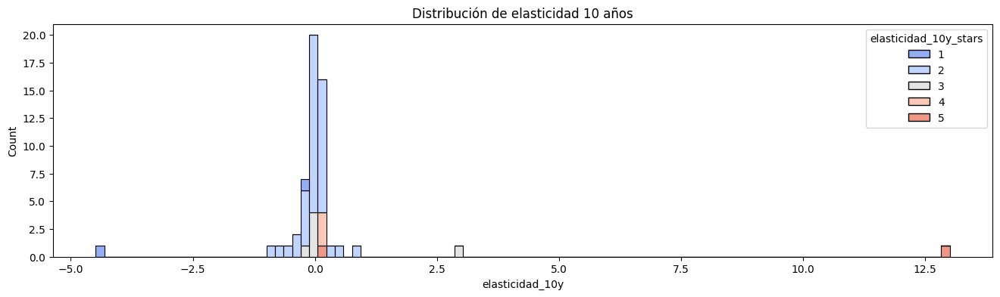

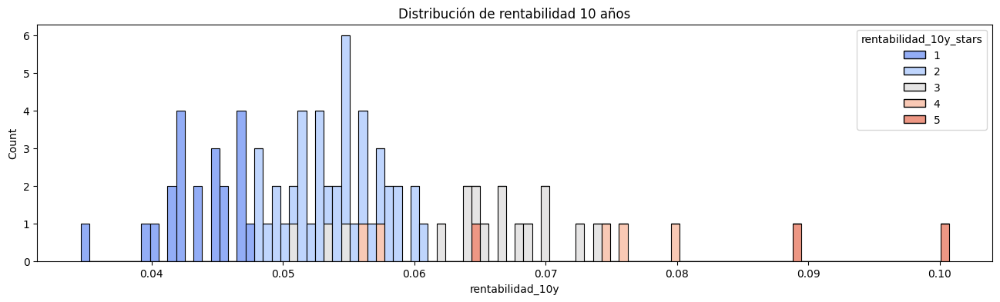

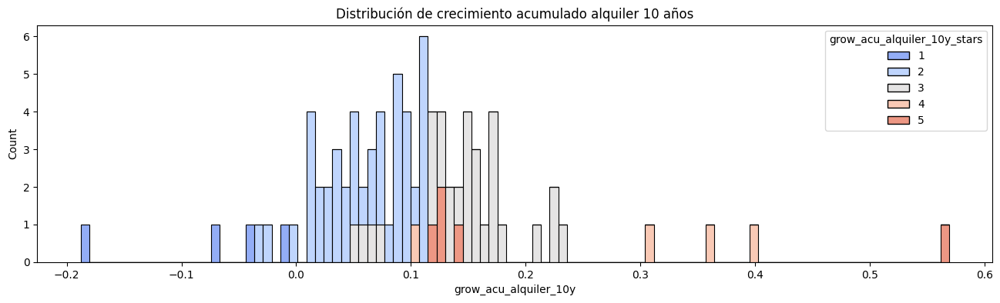

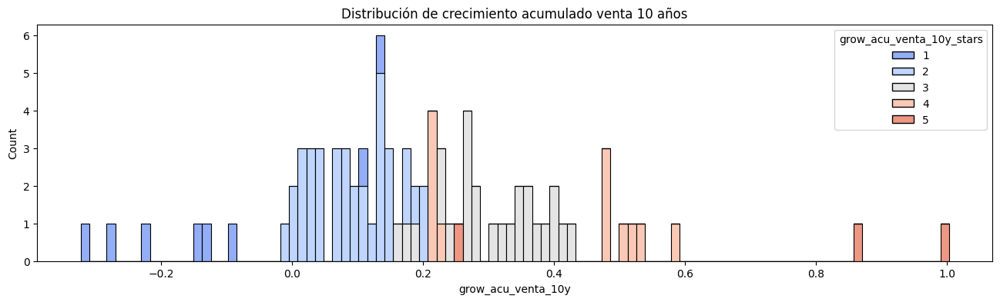

In [8]:
plt.figure(figsize=(16,4))
sns.histplot(data=indicadores, x='elasticidad_10y', bins=100, hue='elasticidad_10y_stars', palette='coolwarm', multiple='stack')
plt.title('Distribución de elasticidad 10 años')
plt.show()

plt.figure(figsize=(16,4))
sns.histplot(data=indicadores, x='rentabilidad_10y', bins=100, hue='rentabilidad_10y_stars', palette='coolwarm', multiple='stack')
plt.title('Distribución de rentabilidad 10 años')
plt.show()

plt.figure(figsize=(16,4))
sns.histplot(data=indicadores, x='grow_acu_alquiler_10y', bins=100, hue='grow_acu_alquiler_10y_stars', palette='coolwarm', multiple='stack')
plt.title('Distribución de crecimiento acumulado alquiler 10 años')
plt.show()

plt.figure(figsize=(16,4))
sns.histplot(data=indicadores, x='grow_acu_venta_10y', bins=100, hue='grow_acu_venta_10y_stars', palette='coolwarm', multiple='stack')
plt.title('Distribución de crecimiento acumulado venta 10 años')
plt.show()


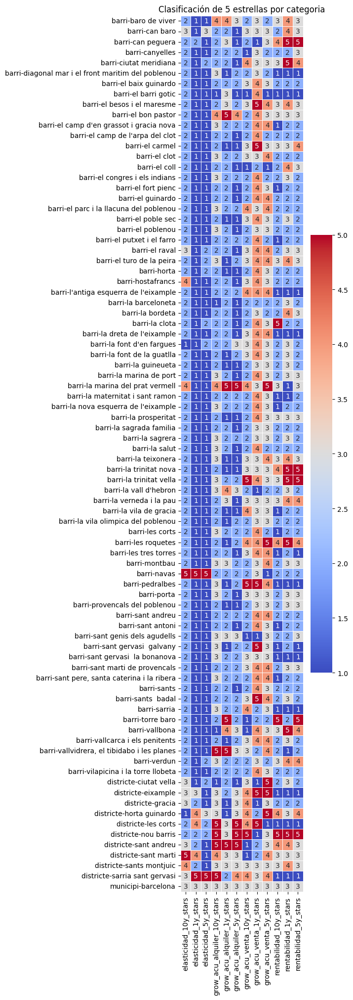

In [9]:
df = indicadores[['tipo','nombre']+star_columns]
for column in star_columns:
    df[column] = pd.to_numeric(df[column], errors='coerce')

df = df.set_index(['tipo','nombre'])

cohort_heatmap(df, index=['tipo','nombre'], columns=None, values=star_columns, title='Clasificación de 5 estrellas por categoria', figsize=(4, 23), fmt='.0f')


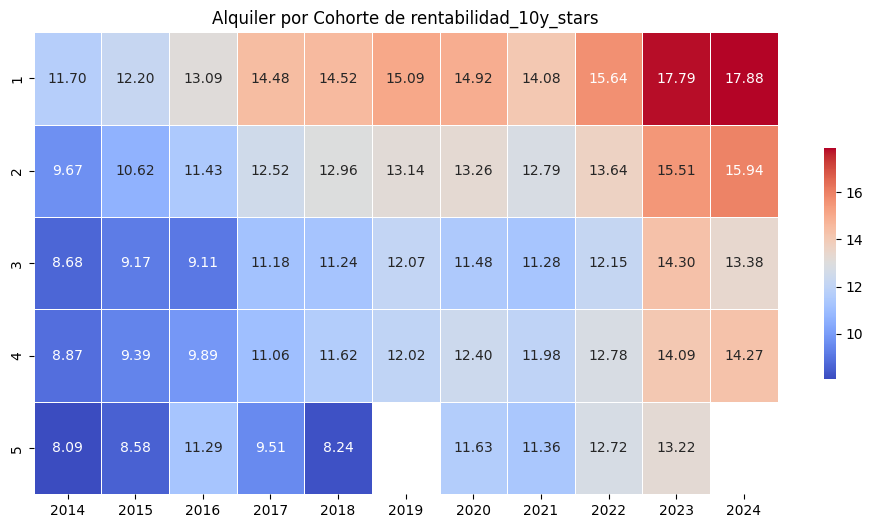

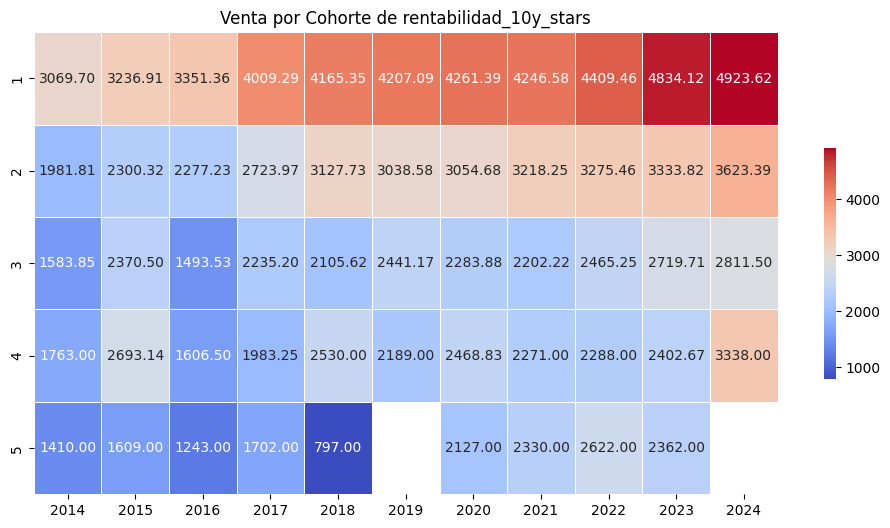

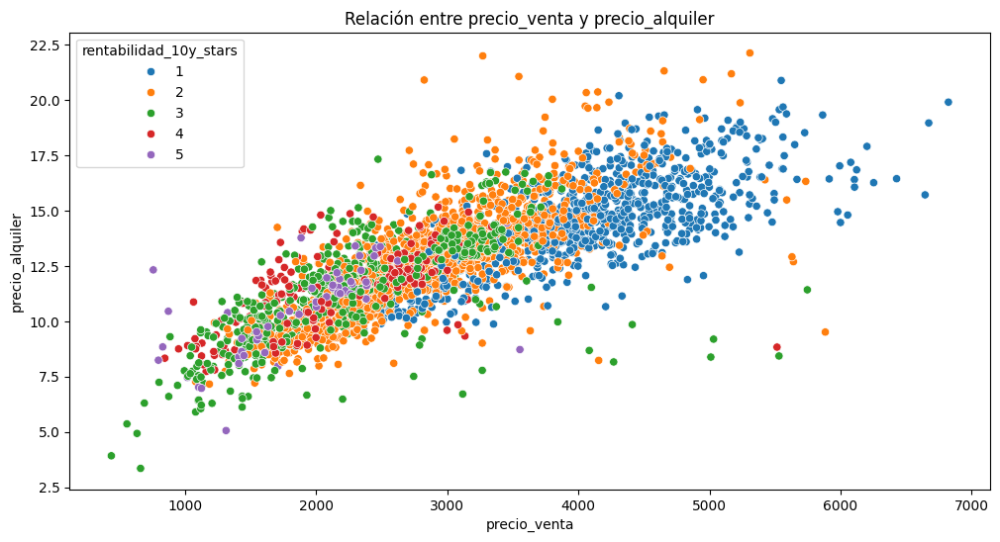

,rentabilidad_10y_stars,count
0,2,4498
1,1,2642
2,3,1670
3,4,507
4,5,190


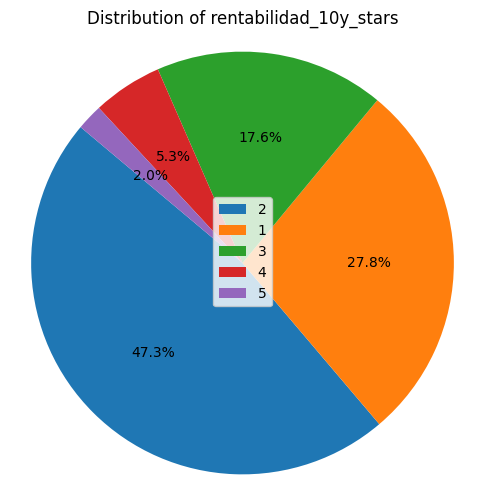

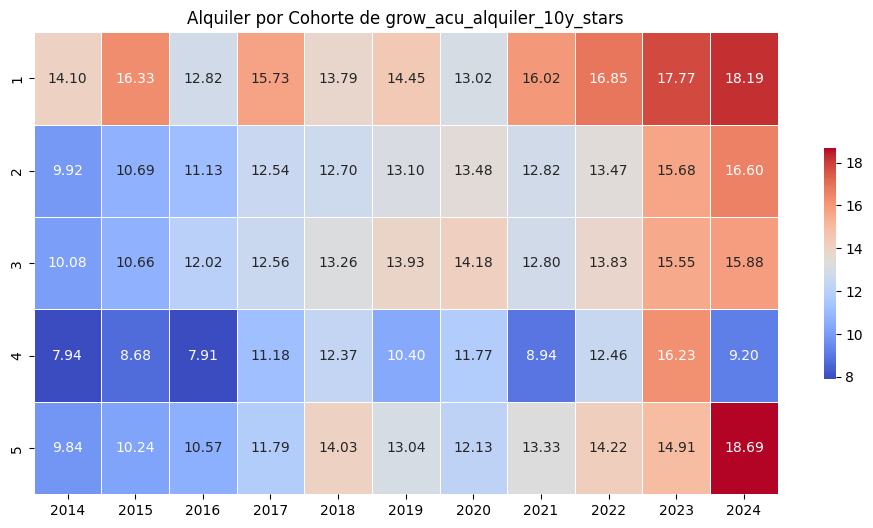

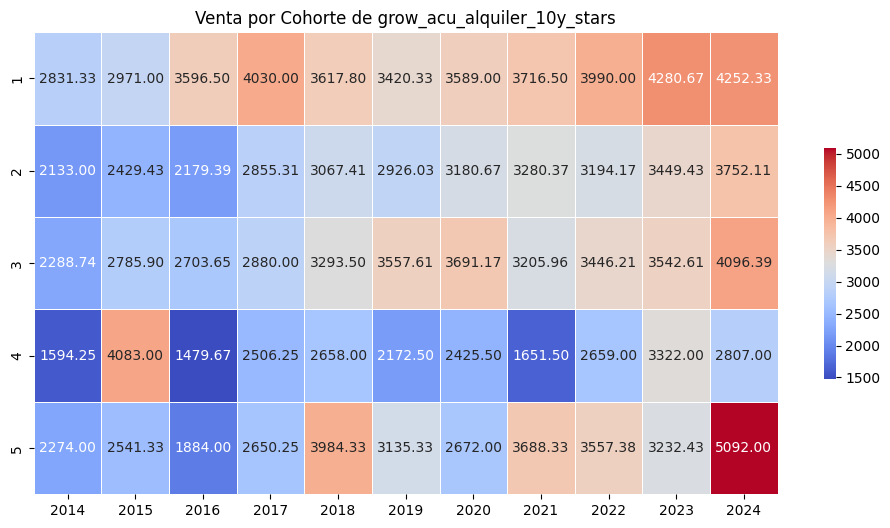

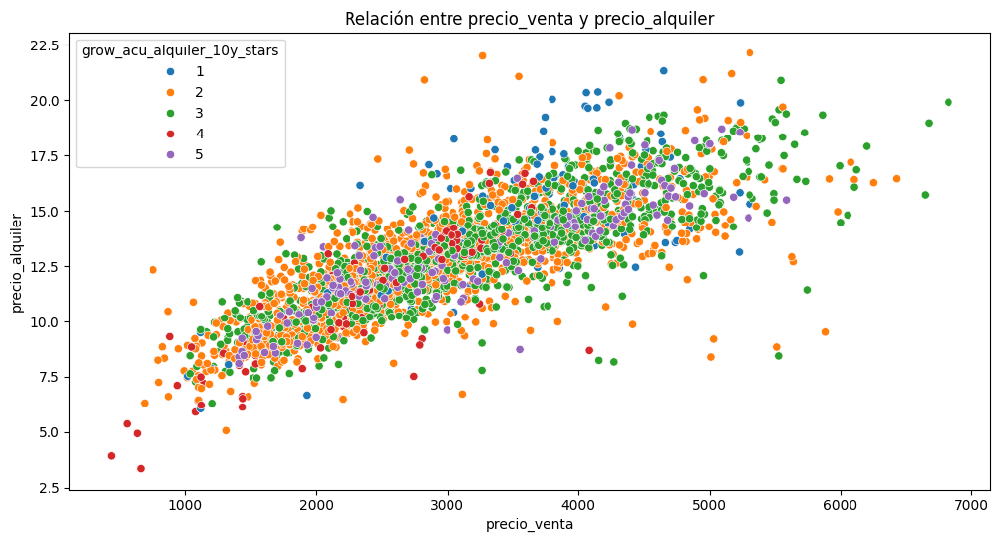

,grow_acu_alquiler_10y_stars,count
0,2,4808
1,3,3414
2,5,571
3,1,404
4,4,310


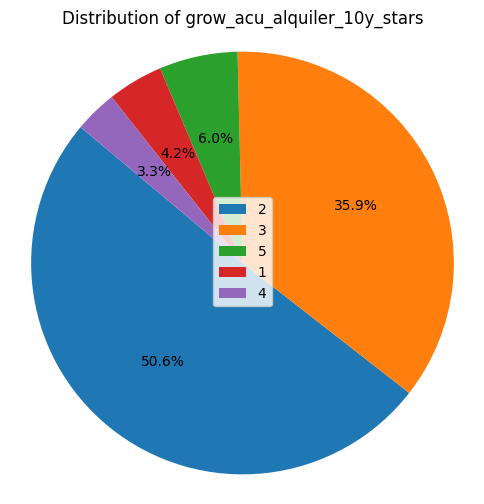

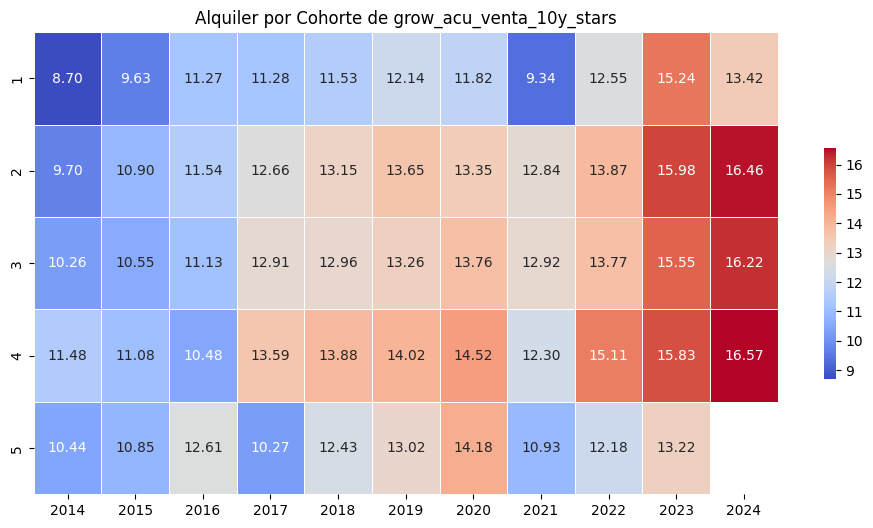

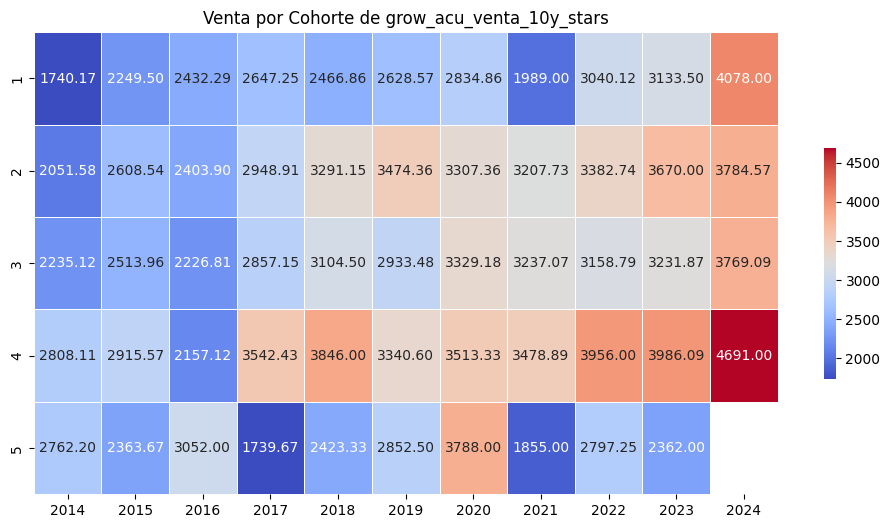

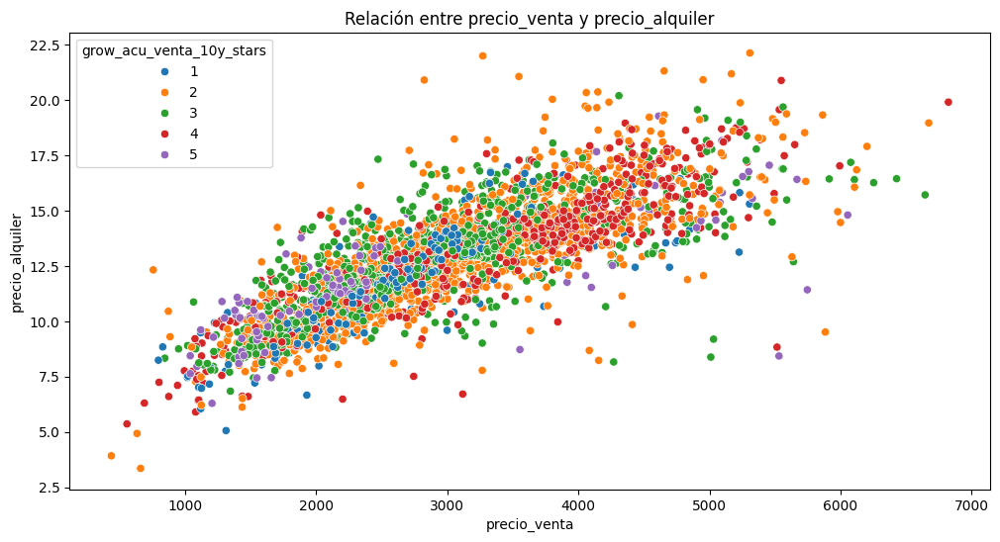

,grow_acu_venta_10y_stars,count
0,2,4045
1,3,2999
2,4,1415
3,1,697
4,5,351


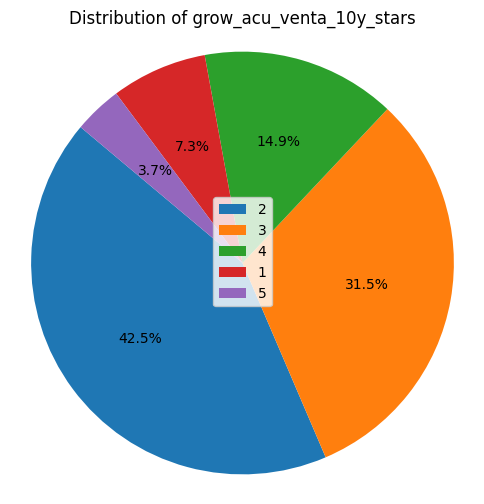

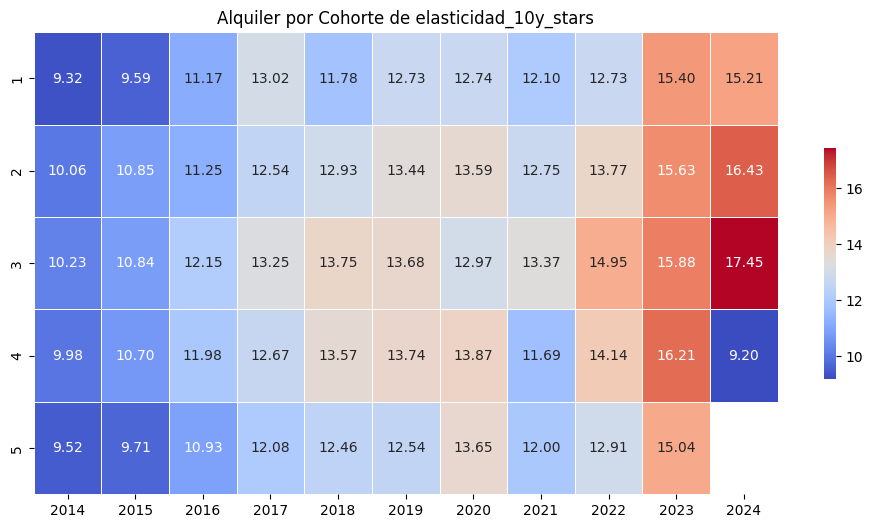

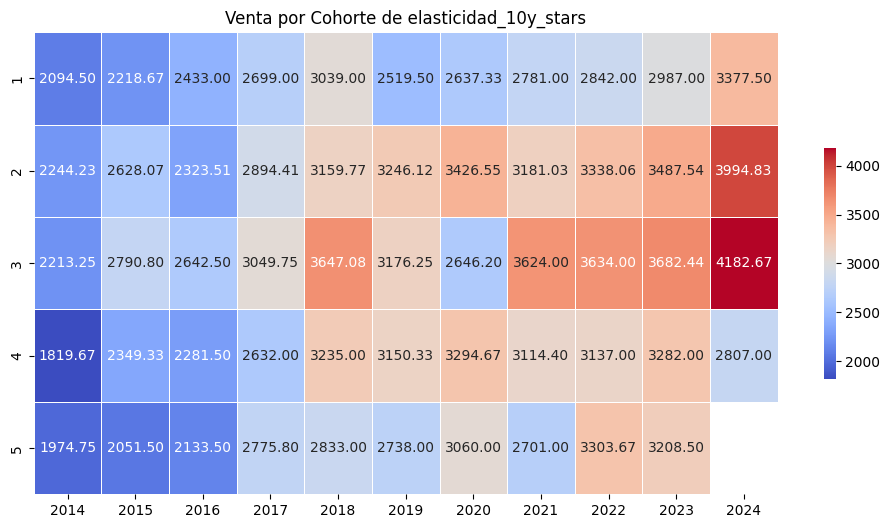

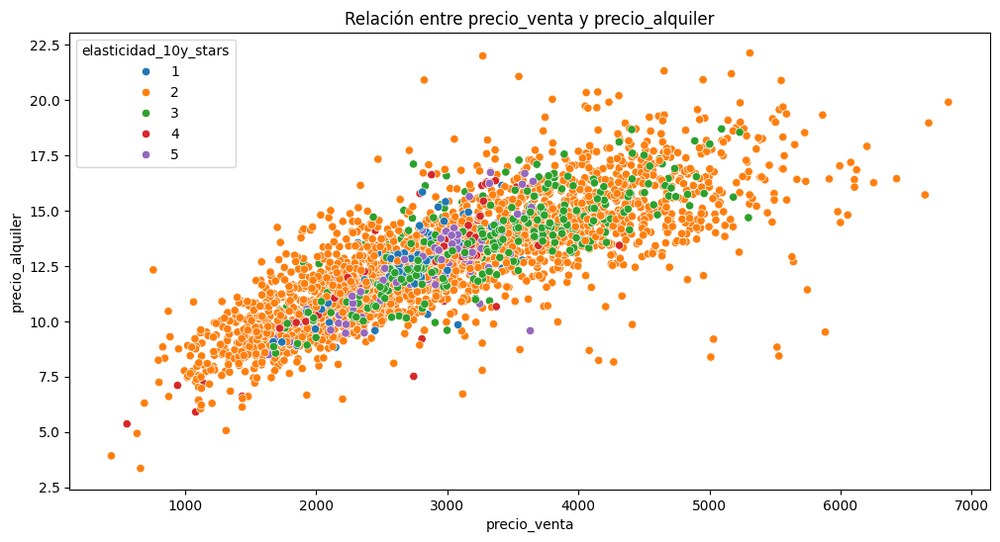

,elasticidad_10y_stars,count
0,2,7740
1,3,1009
2,4,280
3,5,252
4,1,226


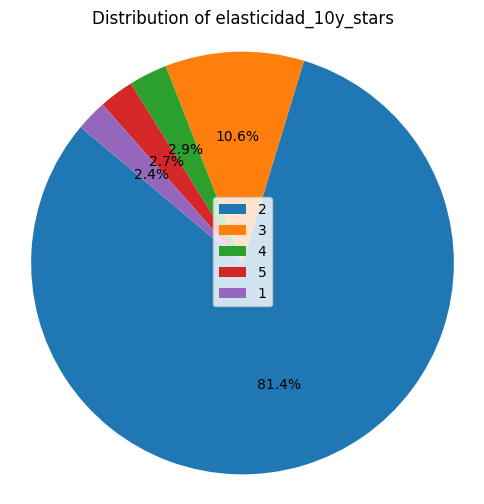

In [10]:
bcn_precios['año'] = bcn_precios['mes'].dt.year  # Extraer el año

def cohort_pie_dist(df, field):
    reason_counts = df[field].value_counts()
    display(reason_counts.reset_index())
    # Create a pie plot using Seaborn for the 'status' column
    fig = plt.figure(figsize=(6,6))
    plt.title(f'Distribution of {field}')
    plt.pie(reason_counts, autopct='%1.1f%%', startangle=140)
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    fig.legend(loc='center', labels=reason_counts.index)
    plt.show()


def cohort_scatter(df, x, y, hue):
    plt.figure(figsize=(12, 6))
    sns.scatterplot(data=df, x=x, y=y, hue=hue)
    plt.title(f"Relación entre {x} y {y}")
    # plt.yscale('log')
    plt.show()


for cohort in ['rentabilidad_10y_stars', 'grow_acu_alquiler_10y_stars', 'grow_acu_venta_10y_stars', 'elasticidad_10y_stars']:

    cohort_heatmap(bcn_precios, cohort, 'año', 'precio_alquiler', f'Alquiler por Cohorte de {cohort}', figsize=(12, 6))
    cohort_heatmap(bcn_precios, cohort, 'año', 'precio_venta', f'Venta por Cohorte de {cohort}', figsize=(12, 6))
    cohort_scatter(bcn_precios, 'precio_venta', 'precio_alquiler', cohort)
    cohort_pie_dist(bcn_precios, cohort)

### **Descripción de la cohorte `cohortes_distrito`**

La cohorte `cohortes_distrito` se genera a partir de los datos del dataset agrupados por **distrito** (`codi_districte`) y **año** (`año`), con el objetivo de analizar las tendencias de los precios de alquiler y venta en diferentes distritos de Barcelona a lo largo del tiempo.

#### **Estructura de la cohorte `cohortes_distrito`**

1. **Identificador de cohorte**: La cohorte se define como la combinación del `codi_districte` (que representa el distrito de la ciudad) y el `año` de la fecha del dato (`mes` transformado en año). Así, cada fila del DataFrame representa un distrito y el año de las mediciones de precios, lo que permite observar cómo han evolucionado los precios de alquiler y venta en ese distrito a lo largo del tiempo.
   
   - **Cohorte**: `cohorte_distrito = codi_districte + '-' + año`

2. **Variables principales**:
   - **`alquiler_medio`**: Precio medio de alquiler en ese distrito y año.
   - **`venta_media`**: Precio medio de venta en ese distrito y año.
   - **`codi_districte`**: Código del distrito, que se usa para identificar el área específica de Barcelona.
   - **`año`**: El año de la medición, extraído de la columna `mes`.

### **Justificación de la cohorte `cohortes_distrito`**

1. **Análisis geográfico a nivel distrital**:
   - **Diferencias regionales**: Los distritos de Barcelona suelen presentar características socioeconómicas distintas. Algunos pueden ser más turísticos, otros más residenciales o comerciales, lo que afecta tanto a la oferta como a la demanda de propiedades. Al crear una cohorte basada en el distrito y año, se puede observar cómo evoluciona el mercado de precios en diferentes áreas de la ciudad.
   - **Estabilidad local**: El análisis de los precios por distrito permite observar si ciertas zonas experimentan una estabilidad o fluctuaciones a lo largo del tiempo, lo que puede ser valioso para inversores, planificadores urbanos y ciudadanos interesados en las tendencias inmobiliarias.

2. **Evolución temporal de los precios**:
   - Al agrupar los datos por año, es posible identificar si los precios de alquiler y venta en un distrito aumentan, disminuyen o permanecen estables a lo largo del tiempo. Esto puede reflejar factores como la gentrificación, cambios en la infraestructura, o políticas urbanísticas locales.
   - **Estacionalidad**: Además de observar las tendencias anuales, esta cohorte podría ser útil para detectar patrones estacionales si se desglosara aún más en base a meses o trimestres.

3. **Impacto de factores externos**:
   - Las variaciones de los precios en los distritos podrían estar influenciadas por eventos o decisiones fuera del control de los individuos, como el desarrollo de infraestructuras, cambios en las leyes de arrendamiento, o proyectos urbanísticos. Esta cohorte ayuda a estudiar cómo esos factores afectan a cada distrito de manera distinta.

4. **Segmentación para análisis detallados**:
   - La cohorte por distrito permite realizar un análisis más granular, lo que facilita la toma de decisiones específicas para cada zona. Por ejemplo, si un distrito muestra un aumento considerable en los precios, podría ser un indicativo de que la zona está siendo más demandada o que está pasando por un proceso de renovación o desarrollo.
   - Las políticas urbanísticas o el desarrollo económico podrían ser analizados en función de cómo afectan a los diferentes distritos. Si el distrito con un alto índice de precios sube significativamente, se podría investigar si el área está siendo renovada o si tiene un crecimiento económico.

### **Conclusión**
La cohorte `cohortes_distrito` es valiosa porque permite hacer un análisis detallado de la evolución de los precios inmobiliarios en Barcelona, proporcionando información útil tanto para analistas de datos como para los responsables de la toma de decisiones en planificación urbana, inversión inmobiliaria y desarrollo económico.

In [11]:
display(bcn_precios)
# Crear columnas adicionales para cohortes
bcn_precios['cohorte_distrito'] = bcn_precios['sup_nombre'] + '-' + bcn_precios['año'].astype(str)  # Cohorte distrito-año
bcn_precios['cohorte_barrio'] = bcn_precios[bcn_precios['tipo'] == 'barri']['nombre'] + '-' + bcn_precios['año'].astype(str)  # Cohorte barrio-año

# Cálculo de métricas por cohorte
cohortes_distrito = bcn_precios.groupby('cohorte_distrito').agg({
    'precio_alquiler': 'mean',
    'precio_venta': 'mean',
    'sup_nombre': 'first',  # Opcional: mantener información adicional
    'año': 'first'  # Año para referencias
}).reset_index()

cohortes_barrio = bcn_precios.groupby('cohorte_barrio').agg({
    'precio_alquiler': 'mean',
    'precio_venta': 'mean',
    'nombre': 'first',  # Opcional: mantener información adicional
    'año': 'first'
}).reset_index()

# Opcional: Renombrar columnas para claridad
cohortes_distrito.rename(columns={
    'precio_alquiler': 'alquiler_medio',
    'precio_venta': 'venta_media'
}, inplace=True)

cohortes_barrio.rename(columns={
    'precio_alquiler': 'alquiler_medio',
    'precio_venta': 'venta_media'
}, inplace=True)

display("Cohortes por distrito:", cohortes_distrito)
display("Cohortes por barrio:", cohortes_barrio)


,id,nombre,sup_id,sup_nombre,tipo,mes,precio_alquiler,precio_venta,superficie_venta,elasticidad_1y_stars,...,grow_acu_venta_1y_stars,elasticidad_5y_stars,rentabilidad_5y_stars,grow_acu_alquiler_5y_stars,grow_acu_venta_5y_stars,elasticidad_10y_stars,rentabilidad_10y_stars,grow_acu_alquiler_10y_stars,grow_acu_venta_10y_stars,año
0,80101,el raval,80100,ciutat vella,barri,2014-01-01,10.62,1772.0,1491.0,1,...,4,2,3,1,4,3,2,2,3,2014
1,80101,el raval,80100,ciutat vella,barri,2014-02-01,NaN,1508.0,2982.0,1,...,4,2,3,1,4,3,2,2,3,2014
2,80101,el raval,80100,ciutat vella,barri,2014-03-01,NaN,1770.0,NaN,1,...,4,2,3,1,4,3,2,2,3,2014
3,80101,el raval,80100,ciutat vella,barri,2014-04-01,10.52,1721.0,NaN,1,...,4,2,3,1,4,3,2,2,3,2014
4,80101,el raval,80100,ciutat vella,barri,2014-05-01,NaN,1678.0,NaN,1,...,4,2,3,1,4,3,2,2,3,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9502,80000,barcelona,800000,barcelones,municipi,2024-05-01,NaN,3793.0,NaN,3,...,3,3,3,3,3,3,3,3,3,2024
9503,80000,barcelona,800000,barcelones,municipi,2024-06-01,NaN,3846.0,122345.0,3,...,3,3,3,3,3,3,3,3,3,2024
9504,80000,barcelona,800000,barcelones,municipi,2024-07-01,NaN,3835.0,NaN,3,...,3,3,3,3,3,3,3,3,3,2024
9505,80000,barcelona,800000,barcelones,municipi,2024-08-01,NaN,3833.0,NaN,3,...,3,3,3,3,3,3,3,3,3,2024


'Cohortes por distrito:'

,cohorte_distrito,alquiler_medio,venta_media,sup_nombre,año
0,barcelona-2014,10.112500,2259.308333,barcelona,2014
1,barcelona-2015,11.081250,2534.150000,barcelona,2015
2,barcelona-2016,12.147500,2677.708333,barcelona,2016
3,barcelona-2017,13.238250,3175.641667,barcelona,2017
4,barcelona-2018,13.358750,3445.825000,barcelona,2018
...,...,...,...,...,...
127,sarria sant gervasi-2020,15.310833,4357.109091,sarria sant gervasi,2020
128,sarria sant gervasi-2021,15.009583,4519.000000,sarria sant gervasi,2021
129,sarria sant gervasi-2022,16.300417,4809.067797,sarria sant gervasi,2022
130,sarria sant gervasi-2023,17.865833,5030.576923,sarria sant gervasi,2023


'Cohortes por barrio:'

,cohorte_barrio,alquiler_medio,venta_media,nombre,año
0,baro de viver-2014,3.9750,438.000000,baro de viver,2014
1,baro de viver-2015,4.7000,634.000000,baro de viver,2015
2,baro de viver-2016,3.6000,576.500000,baro de viver,2016
3,baro de viver-2017,6.2100,1124.000000,baro de viver,2017
4,baro de viver-2018,7.5400,1122.000000,baro de viver,2018
...,...,...,...,...,...
797,vilapicina i la torre llobeta-2020,12.2850,2622.600000,vilapicina i la torre llobeta,2020
798,vilapicina i la torre llobeta-2021,11.5800,2869.090909,vilapicina i la torre llobeta,2021
799,vilapicina i la torre llobeta-2022,12.8225,2849.000000,vilapicina i la torre llobeta,2022
800,vilapicina i la torre llobeta-2023,13.7575,2991.909091,vilapicina i la torre llobeta,2023


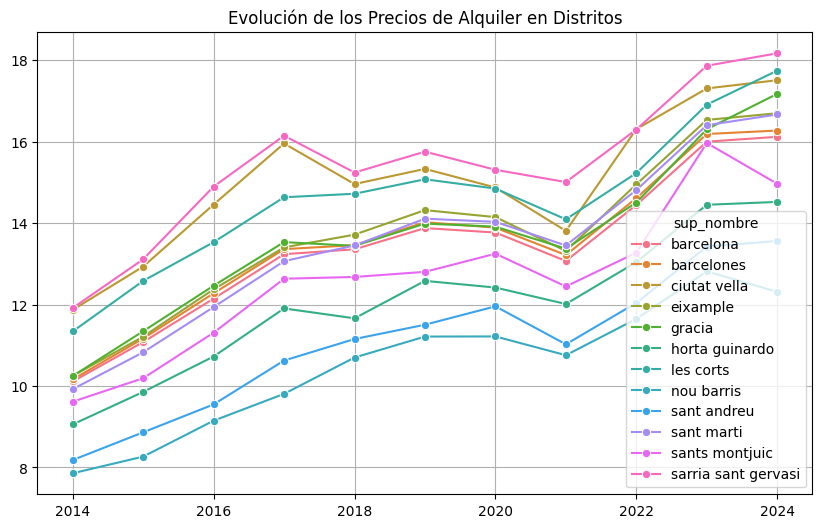

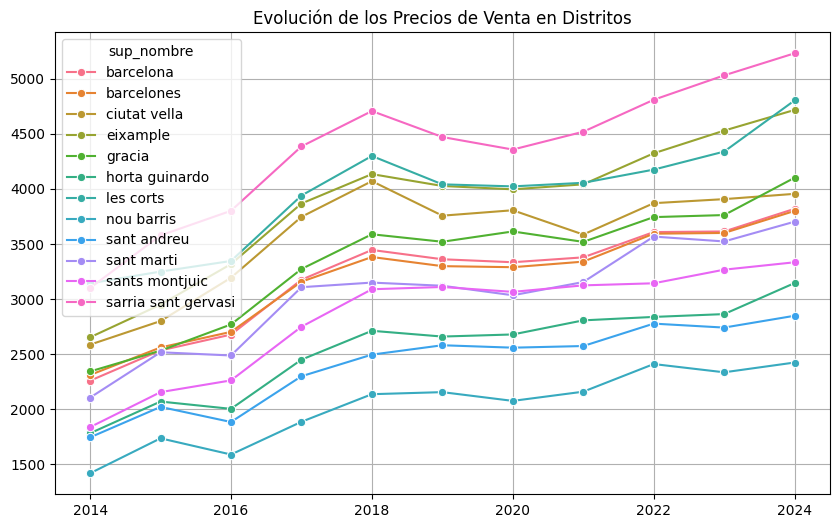

In [12]:
# Filtrar para los primeros distritos (ejemplo)
cohortes_distrito_9 = cohortes_distrito[cohortes_distrito['sup_nombre'] == 'sant andreu']

plt.figure(figsize=(10, 6))
sns.lineplot(data=cohortes_distrito, x='año', y='alquiler_medio', marker='o', hue='sup_nombre')
plt.title("Evolución de los Precios de Alquiler en Distritos")
plt.xlabel("")
plt.ylabel("")
# plt.yscale('log')
plt.grid(True)
plt.show()

plt.figure(figsize=(10, 6))
sns.lineplot(data=cohortes_distrito, x='año', y='venta_media', marker='o', hue='sup_nombre')
plt.title("Evolución de los Precios de Venta en Distritos")
plt.xlabel("")
plt.ylabel("")
# plt.yscale('log')
plt.grid(True)
plt.show()


<Figure size 1000x600 with 0 Axes>

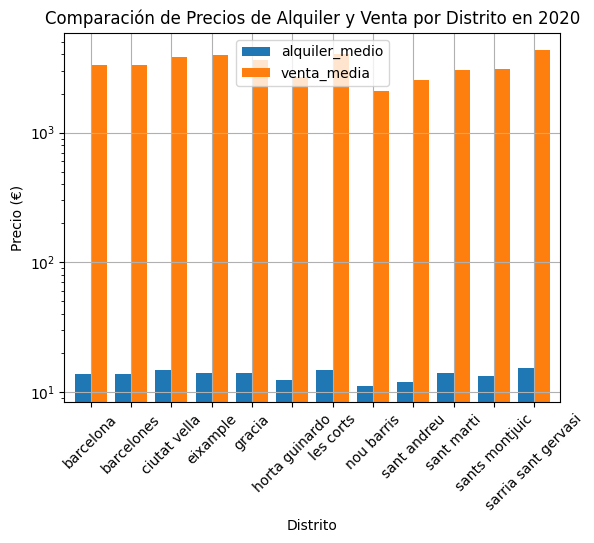

In [13]:
# Filtrar los datos para el año 2020 (por ejemplo)
cohortes_distrito_2020 = cohortes_distrito[cohortes_distrito['año'] == 2020]

plt.figure(figsize=(10, 6))
cohortes_distrito_2020.set_index('sup_nombre')[['alquiler_medio', 'venta_media']].plot(kind='bar', width=0.8, logy=True)

plt.title("Comparación de Precios de Alquiler y Venta por Distrito en 2020")
plt.xlabel("Distrito")
plt.ylabel("Precio (€)")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


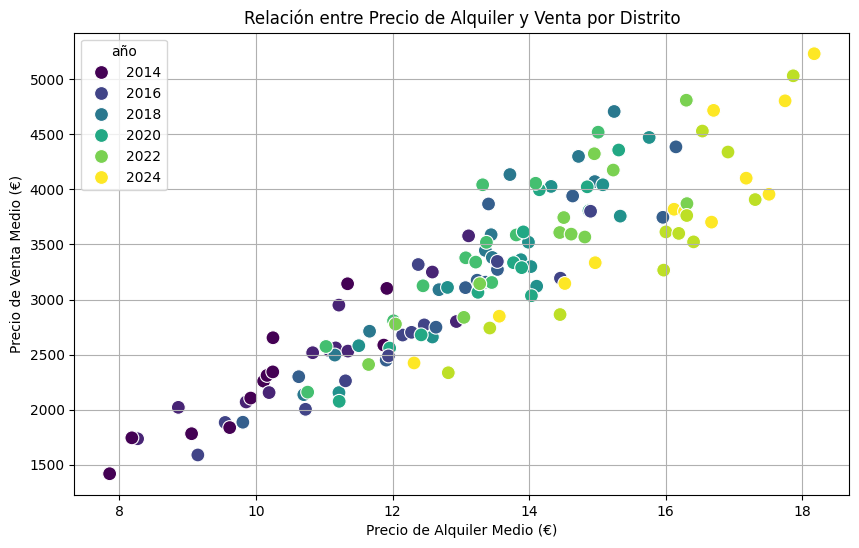

In [14]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=cohortes_distrito, x='alquiler_medio', y='venta_media', hue='año', palette='viridis', s=100, marker='o')

plt.title("Relación entre Precio de Alquiler y Venta por Distrito")
plt.xlabel("Precio de Alquiler Medio (€)")
plt.ylabel("Precio de Venta Medio (€)")
plt.grid(True)
plt.show()


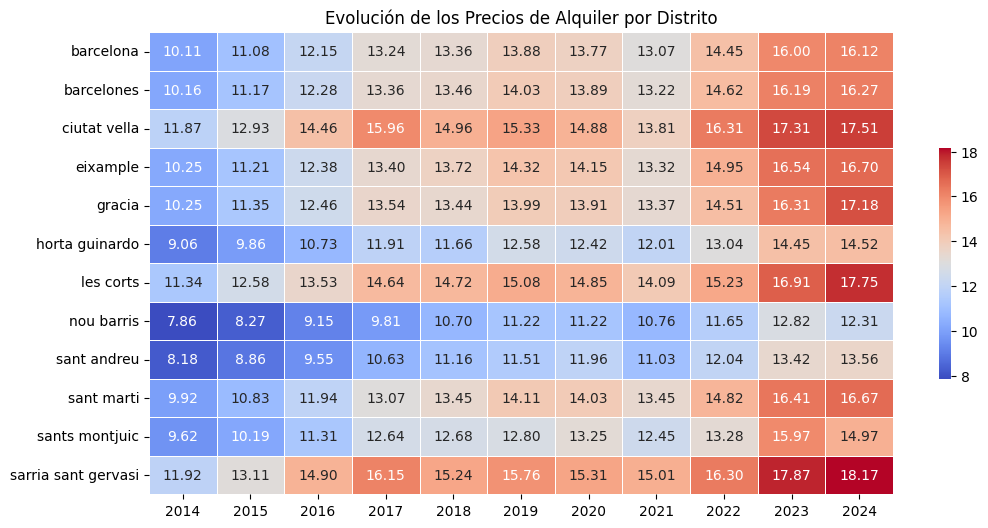

In [15]:

cohort_heatmap(cohortes_distrito, 'sup_nombre', 'año', 'alquiler_medio', 'Evolución de los Precios de Alquiler por Distrito', figsize=(12, 6))


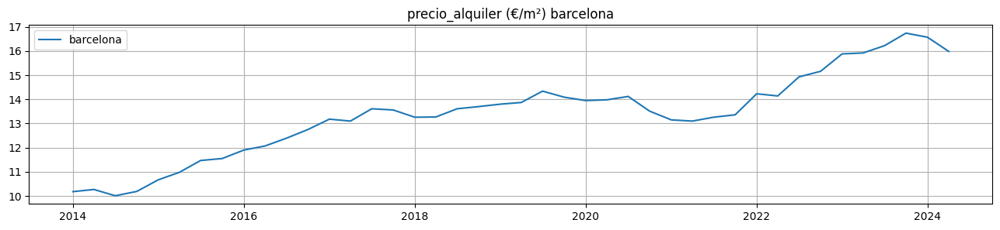

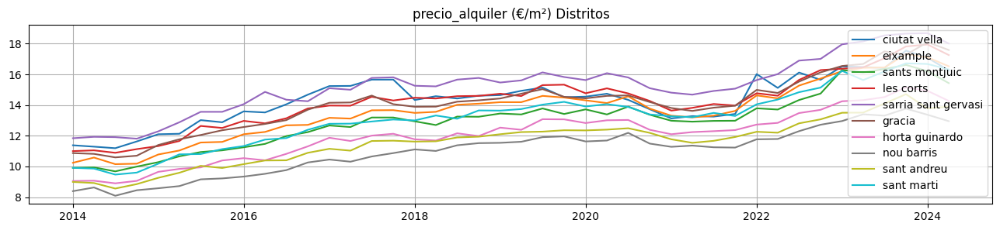

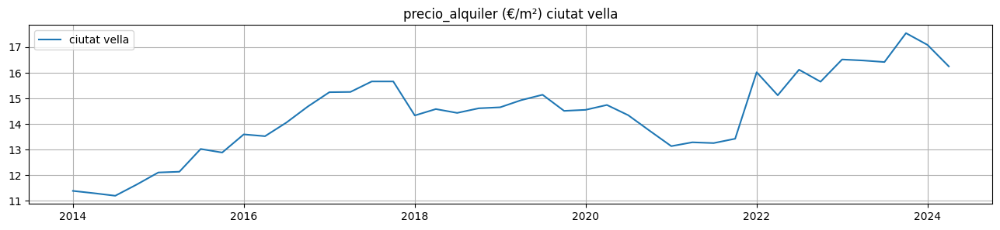

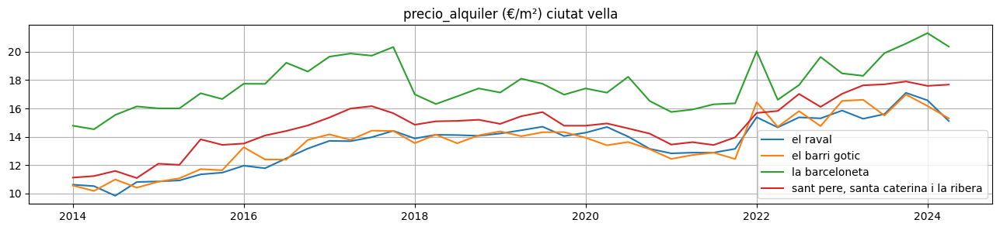

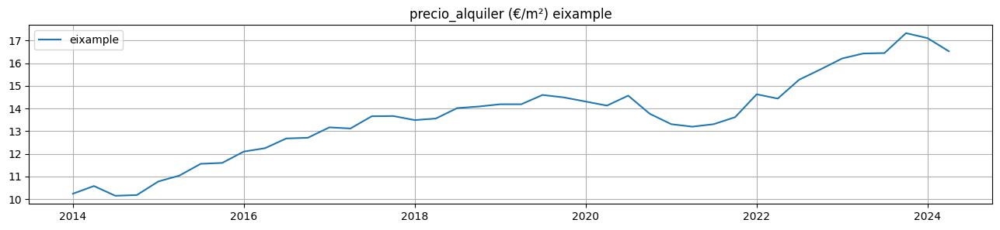

...

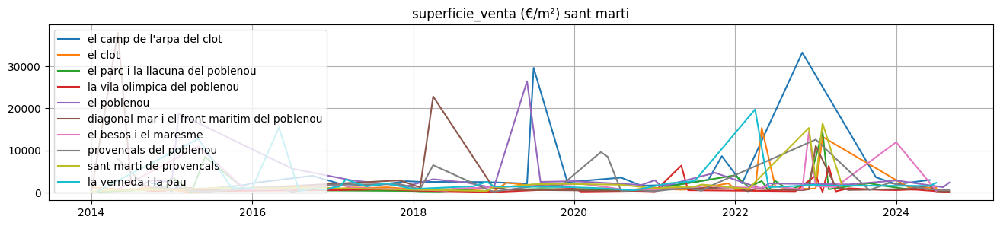

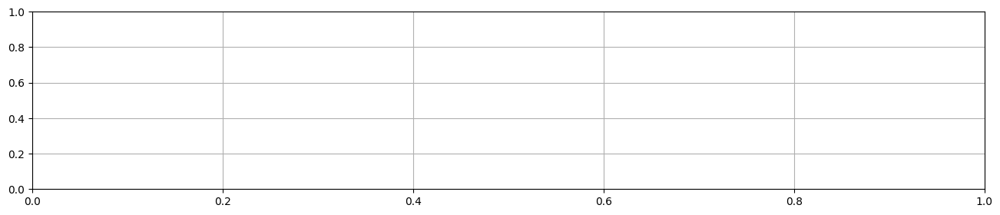

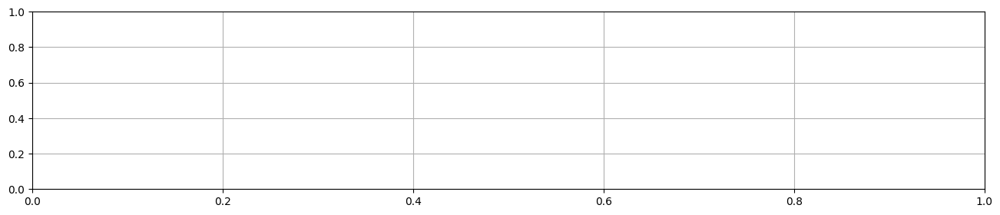

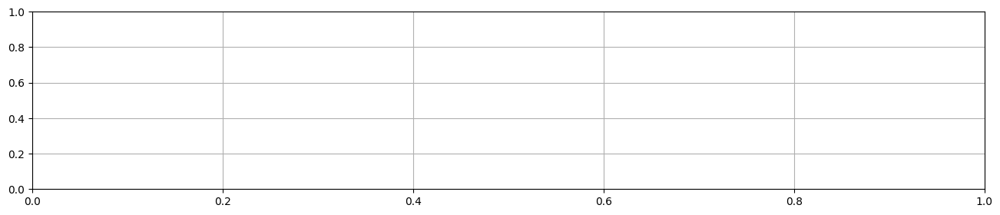

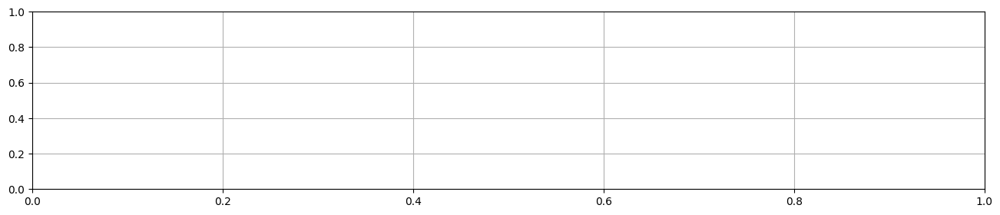

In [16]:
def plot_dist(df, field, figsize=(16, 4), title='', model=None):
    fig = plt.figure(figsize=figsize)
    for c in df['nombre'].unique():
        # sns.scatterplot(x='mes', y=field, data=df[df['nombre'] == c], markers='.')
        sns.lineplot(x='mes', y=field, data=df[df['nombre'] == c], label=c)
        plt.title(f'{field} (€/m²) '+title)
    plt.grid(True)
    plt.xlabel('')
    plt.ylabel('')
    plt.show()


for field in ['precio_alquiler', 'precio_venta', 'superficie_venta']:
    plot_dist(bcn_precios[bcn_precios['nombre'] == 'barcelona'], field,figsize=(16,3), title='barcelona')
    plot_dist(bcn_precios[bcn_precios['tipo'] == 'districte'], field,figsize=(16,3), title='Distritos')

    for dist in bcn_precios['sup_nombre'].dropna().unique().tolist():
        plot_dist(bcn_precios[(bcn_precios['nombre'] == dist) & (bcn_precios['tipo'] == 'districte')], field,figsize=(16,3), title=dist)
        plot_dist(bcn_precios[(bcn_precios['sup_nombre'] == dist) & (bcn_precios['tipo'] == 'barri')], field,figsize=(16,3), title=dist)


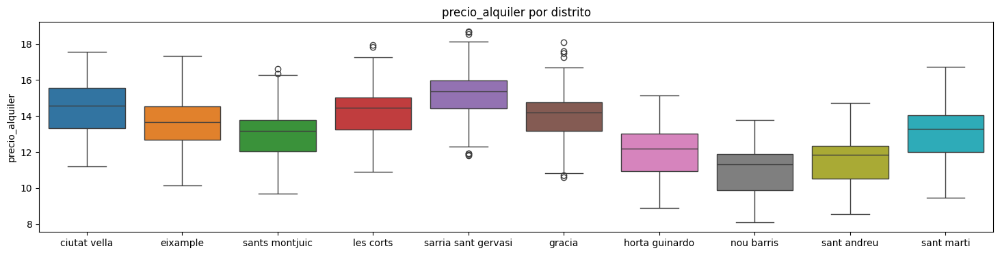

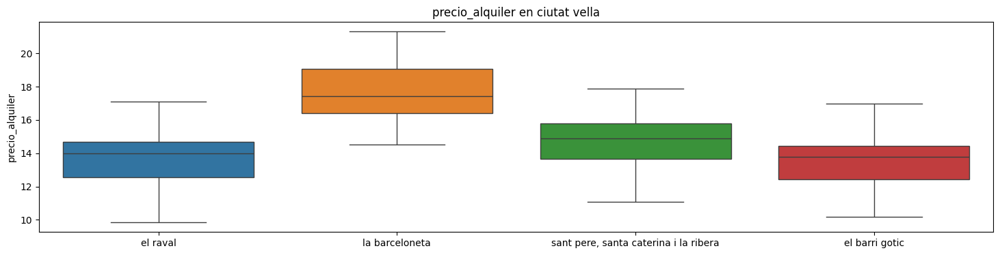

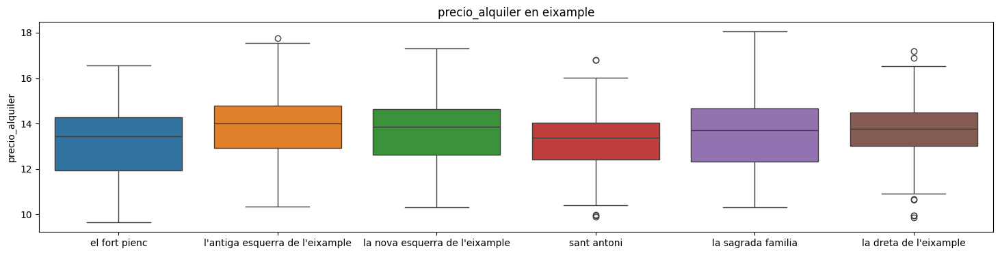

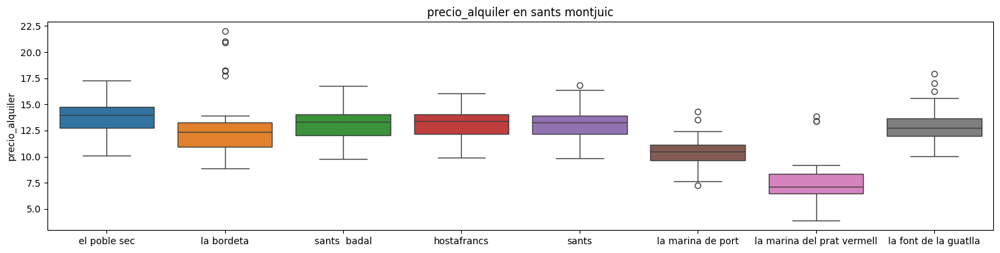

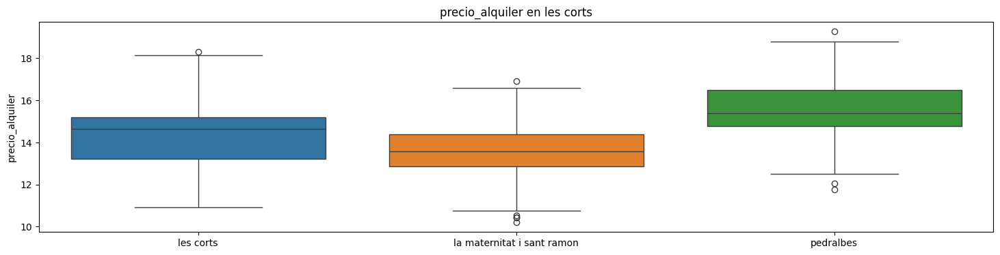

...

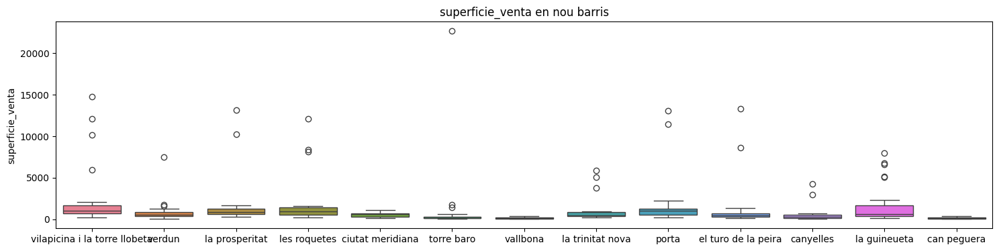

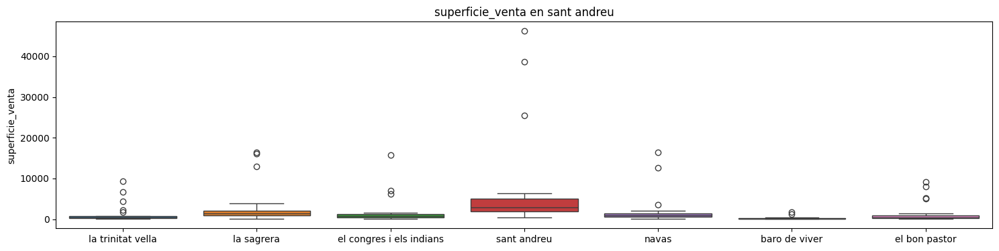

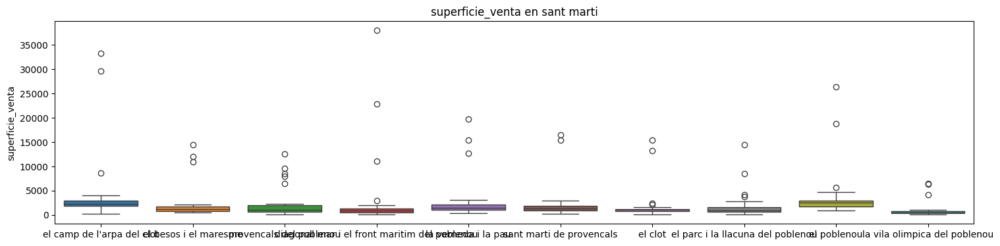

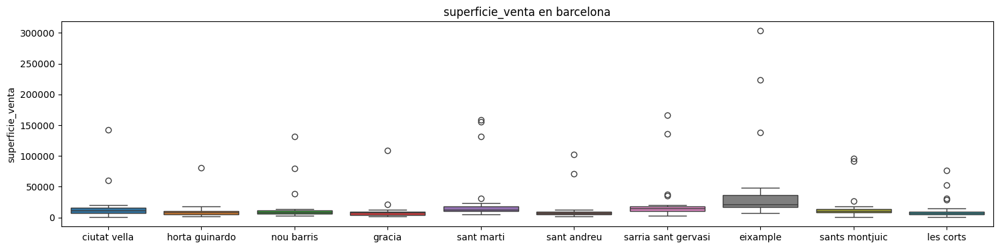

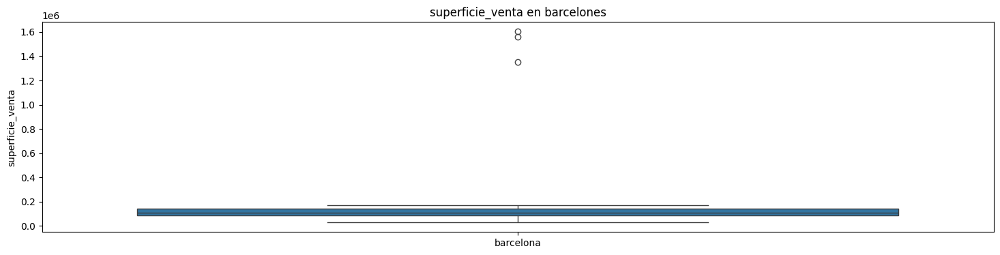

In [17]:
for field in ['precio_alquiler', 'precio_venta', 'superficie_venta']:
    fig = plt.figure(figsize=(18, 4))
    sns.boxplot(bcn_precios[bcn_precios['tipo'] == 'districte'], x='nombre', y=field, hue='nombre')
    plt.xlabel("")
    plt.title(f'{field} por distrito')
    plt.show()


    for dist in bcn_precios['sup_nombre'].dropna().unique().tolist():
        fig = plt.figure(figsize=(18, 4))
        sns.boxplot(bcn_precios[bcn_precios['sup_nombre'] == dist].sort_values(by='tipo', ascending=False), x='nombre', y=field, hue='nombre')
        plt.xlabel("")
        plt.title(f'{field} en {dist}')
        plt.show()


# for y in ['precio_alquiler', 'precio_venta']:
#     fig = plt.figure(figsize=(16, 4))
#     sns.boxplot(bcn_precios[bcn_precios['tipo'] == 'districte'], x='nombre', y=y, hue='nombre')
#     plt.xlabel("")
#     plt.title(f'{y} (€/m²) por distrito')
#     plt.show()


# for dist in bcn_precios['sup_nombre'].dropna().unique().tolist():
#     for y in ['precio_alquiler', 'precio_venta']:
        # fig = plt.figure(figsize=(16, 4))
        # sns.boxplot(bcn_precios[(bcn_precios_int['sup_nombre'] == dist) & (bcn_precios_int['tipo'] == 'barri')], x='nombre', y=y, hue='nombre')
        # plt.xlabel("")
        # plt.title(f'{y} (€/m²) por barrio en {dist}')
        # plt.show()


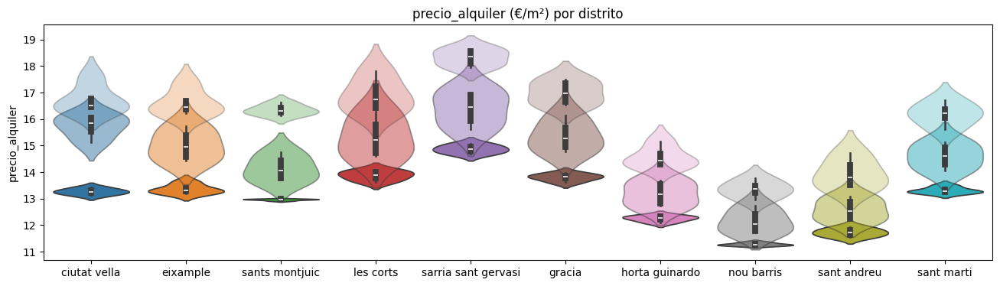

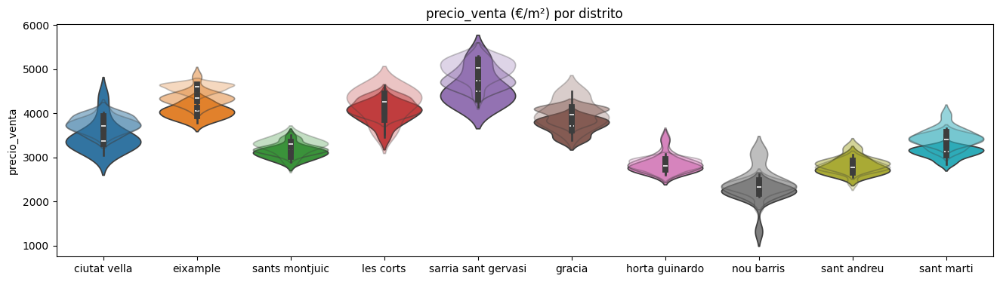

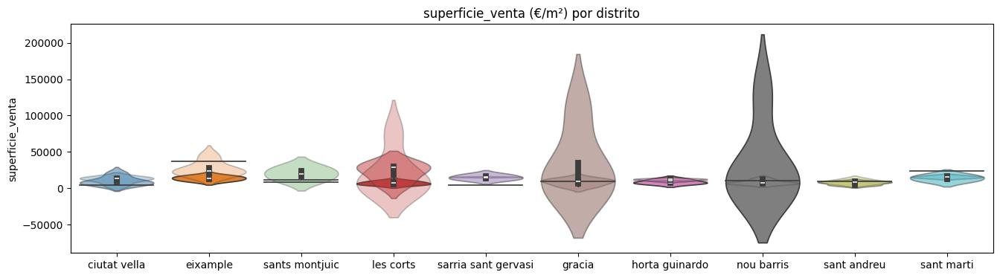

In [18]:
for y in ['precio_alquiler', 'precio_venta','superficie_venta']:
    fig = plt.figure(figsize=(16, 4))
    sns.violinplot(bcn_precios[(bcn_precios['tipo'] == 'districte') & (bcn_precios['mes'].dt.year == 2021)], x='nombre', y=y, hue='nombre', split=False)
    sns.violinplot(bcn_precios[(bcn_precios['tipo'] == 'districte') & (bcn_precios['mes'].dt.year == 2022)], x='nombre', y=y, hue='nombre', split=False, alpha=0.5)
    sns.violinplot(bcn_precios[(bcn_precios['tipo'] == 'districte') & (bcn_precios['mes'].dt.year == 2023)], x='nombre', y=y, hue='nombre', split=False, alpha=0.3)
    plt.xlabel("")
    plt.title(f'{y} (€/m²) por distrito')
    plt.show()